In [1]:
!pip uninstall -y cupy cupy-cuda11x cupy-cuda12x
!pip install -U "cupy-cuda12x"


Found existing installation: cupy-cuda12x 13.6.0
Uninstalling cupy-cuda12x-13.6.0:
  Successfully uninstalled cupy-cuda12x-13.6.0
  Using cached cupy_cuda12x-13.6.0-cp312-cp312-manylinux2014_x86_64.whl.metadata (2.4 kB)
Using cached cupy_cuda12x-13.6.0-cp312-cp312-manylinux2014_x86_64.whl (112.9 MB)


In [3]:
!pip install pillow
# Используйте колесо CuPy, соответствующее вашей версии CUDA, например:
# 请使用与您的 CUDA 版本相匹配的 CuPy wheel，例如：
!pip install cupy-cuda12x


In [4]:
# Colab cell #1: check GPU and try to install appropriate CuPy; fallback to SciPy if CuPy unavailable
# Paste & run in a Colab code cell

import subprocess, sys, textwrap, os, json, shutil

def run(cmd):
    print("$", cmd)
    p = subprocess.run(cmd, shell=True, stdout=subprocess.PIPE, stderr=subprocess.STDOUT, text=True)
    print(p.stdout)
    return p.returncode, p.stdout

print("Checking nvidia-smi...")
rc, out = run("nvidia-smi --query-gpu=driver_version,cuda_version --format=csv,noheader,nounits || true")

cuda_ver = None
if "CUDA Version" in out or "cuda_version" in out.lower() or out.strip() != "":
    # try to parse something like "11.8" or lines
    import re
    m = re.search(r'(\d+\.\d+)', out)
    if m:
        cuda_ver = m.group(1)
print("Detected CUDA version:", cuda_ver)

# list candidate wheels (common): try cuda11x then cuda12x
candidates = []
if cuda_ver:
    major = int(cuda_ver.split(".")[0])
    if major >= 12:
        candidates = ["cupy-cuda12x", "cupy"]
    elif major >= 11:
        candidates = ["cupy-cuda11x", "cupy"]
    else:
        candidates = ["cupy"]
else:
    # unknown, try common ones
    candidates = ["cupy-cuda11x", "cupy-cuda12x", "cupy"]

# attempt installs
installed = False
for pkg in candidates:
    print(f"Trying to install {pkg} ...")
    rc, out = run(f"{sys.executable} -m pip install -q {pkg}")
    if rc == 0:
        # quick import test
        try:
            __import__("cupy")
            print("CuPy import succeeded.")
            installed = True
            break
        except Exception as e:
            print("CuPy import failed:", e)
            # continue to next
    else:
        print(f"pip install exit code {rc}")

if not installed:
    print("\nCould not install usable CuPy wheel. Falling back to CPU-only SciPy implementation.")
    print("Installing SciPy (if not present)...")
    run(f"{sys.executable} -m pip install -q scipy")
else:
    # show cupy version
    try:
        import cupy as cp
        print("cupy version:", cp.__version__)
    except Exception as e:
        print("cupy import error:", e)


Checking nvidia-smi...
$ nvidia-smi --query-gpu=driver_version,cuda_version --format=csv,noheader,nounits || true
Field "cuda_version" is not a valid field to query.


Detected CUDA version: None
Trying to install cupy-cuda11x ...
$ /usr/bin/python3 -m pip install -q cupy-cuda11x

CuPy import succeeded.
cupy version: 13.6.0


In [5]:
from google.colab import files
from IPython.display import Image

In [6]:
uploaded = files.upload()

Saving GPU_test2.jpg to GPU_test2 (2).jpg


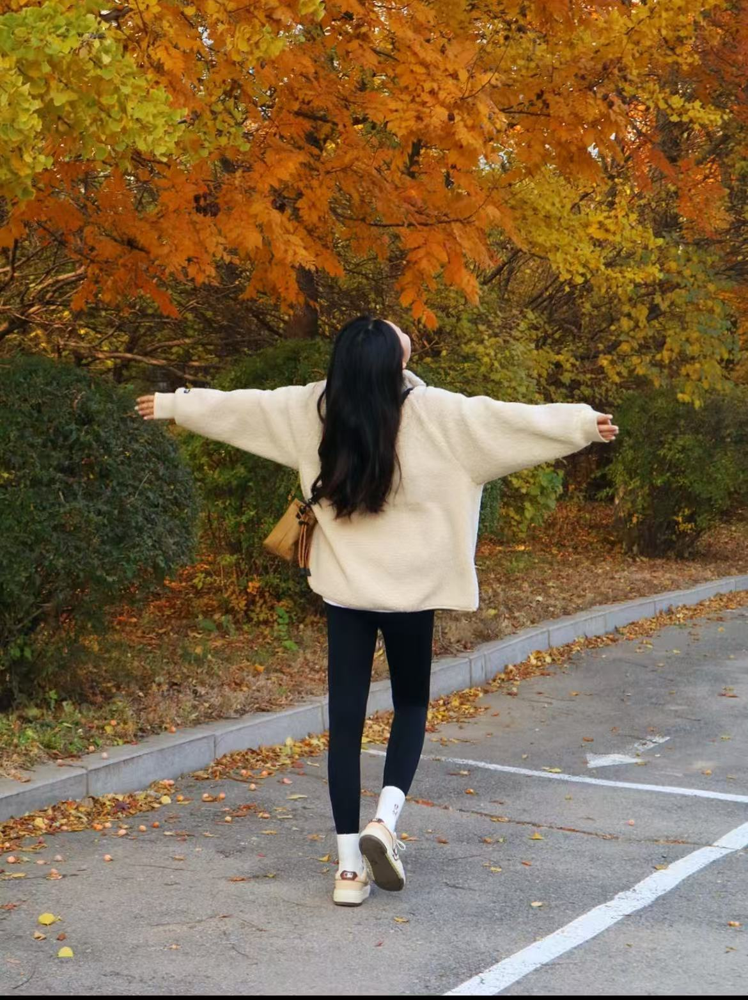

In [7]:
Image('GPU_test2.jpg' ,
      width = 565)

In [8]:
# Colab cell #2: upload file (or mount Drive)
from google.colab import files
uploaded = files.upload()  # choose 'GPU_test2.jpg' from your machine

# get the first uploaded filename
fn = next(iter(uploaded.keys()))
print("Uploaded:", fn)


Saving GPU_test2.jpg to GPU_test2 (3).jpg
Uploaded: GPU_test2 (3).jpg


Using GPU (CuPy) backend. cupy version: 13.6.0
Input file: GPU_test2 (3).jpg
Image shape: (1563, 1170, 3)
Copy to device: 22.9 ms
Blur time: 1513.2 ms


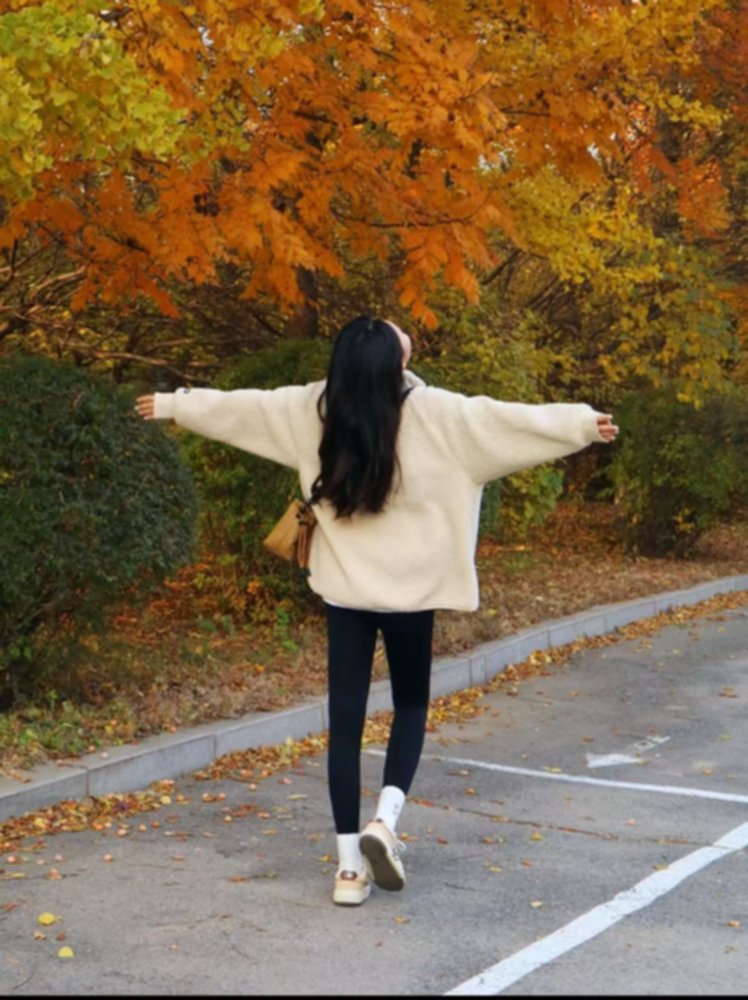

Edge detection time: 2115.9 ms


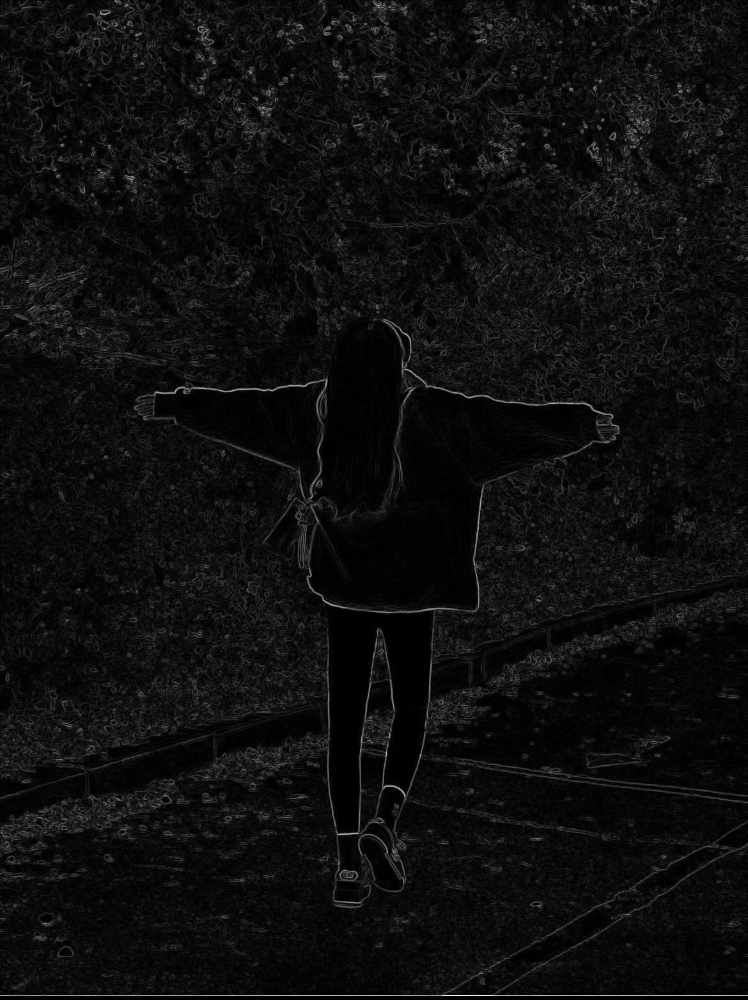

Median denoise time: 6005.3 ms


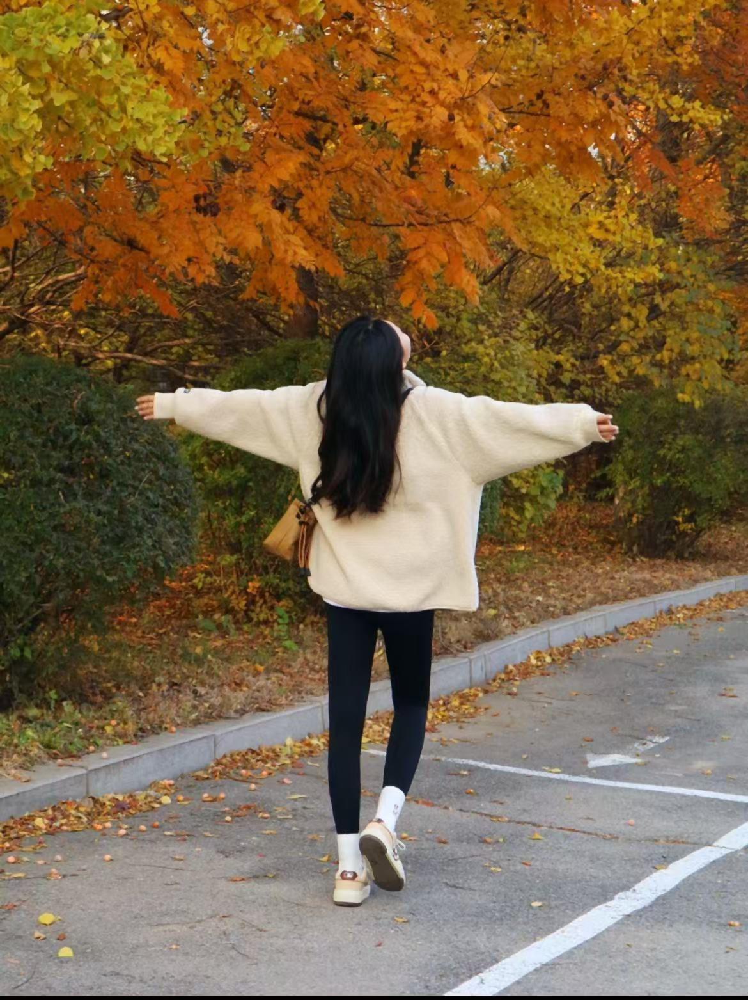

Saved files: result_blur.png result_edges.png result_median.png


In [9]:
# Colab cell #3: processing code
import os, time
from PIL import Image
import numpy as np
from IPython.display import display

# detect whether cupy is available
try:
    import cupy as cp
    import cupyx.scipy.ndimage as cnd_gpu
    USE_CUPY = True
except Exception:
    USE_CUPY = False

if not USE_CUPY:
    from scipy import ndimage as cnd_cpu
    print("Using CPU (SciPy) backend.")
else:
    print("Using GPU (CuPy) backend. cupy version:", cp.__version__)

# IO helpers
def load_image(path):
    img = Image.open(path).convert('RGB')
    arr = np.asarray(img, dtype=np.float32) / 255.0
    return arr

def save_image_float01(arr, path):
    arr = np.clip(arr * 255.0, 0, 255).astype(np.uint8)
    img = Image.fromarray(arr)
    img.save(path, format='PNG')

# wrappers
if USE_CUPY:
    xp = cp
    nd = cnd_gpu
    def to_device(a): return cp.asarray(a, dtype=cp.float32)
    def to_host(a): return cp.asnumpy(a)
    def sync(): cp.cuda.Stream.null.synchronize()
else:
    xp = np
    nd = cnd_cpu
    def to_device(a): return a.astype(np.float32)
    def to_host(a): return a
    def sync(): None

# filters
def box_blur(img_xp, kernel_size=5):
    k = kernel_size
    kernel = xp.ones((k,k), dtype=xp.float32) / (k*k)
    out = xp.empty_like(img_xp)
    for c in range(img_xp.shape[2]):
        out[..., c] = nd.convolve(img_xp[..., c], kernel, mode='mirror')
    return out

def sobel_edge(img_xp):
    kx = xp.array([[-1,0,1],[-2,0,2],[-1,0,1]], dtype=xp.float32)
    ky = xp.array([[-1,-2,-1],[0,0,0],[1,2,1]], dtype=xp.float32)
    gray = 0.2989 * img_xp[...,0] + 0.5870 * img_xp[...,1] + 0.1140 * img_xp[...,2]
    gx = nd.convolve(gray, kx, mode='mirror')
    gy = nd.convolve(gray, ky, mode='mirror')
    mag = xp.sqrt(gx*gx + gy*gy)
    # normalize
    mag = (mag - mag.min()) / (mag.max() - mag.min() + 1e-12)
    out = xp.stack([mag, mag, mag], axis=-1)
    return out

def median_denoise(img_xp, size=3):
    out = xp.empty_like(img_xp)
    for c in range(img_xp.shape[2]):
        out[..., c] = nd.median_filter(img_xp[..., c], size=size, mode='mirror')
    return out

# process uploaded file (fn must be defined by upload cell)
INPUT = fn  # from upload cell
PREFIX = "result"

print("Input file:", INPUT)
arr = load_image(INPUT)
print("Image shape:", arr.shape)

# copy to device
t0 = time.perf_counter()
img_dev = to_device(arr)
sync()
t1 = time.perf_counter()
print(f"Copy to device: {(t1-t0)*1000:.1f} ms")

# blur
t0 = time.perf_counter()
blurred = box_blur(img_dev, kernel_size=5)
sync()
t1 = time.perf_counter()
print(f"Blur time: {(t1-t0)*1000:.1f} ms")
out_blur = to_host(blurred)
save_image_float01(out_blur, PREFIX + "_blur.png")
display(Image.open(PREFIX + "_blur.png"))

# edges
t0 = time.perf_counter()
edges = sobel_edge(img_dev)
sync()
t1 = time.perf_counter()
print(f"Edge detection time: {(t1-t0)*1000:.1f} ms")
out_edges = to_host(edges)
save_image_float01(out_edges, PREFIX + "_edges.png")
display(Image.open(PREFIX + "_edges.png"))

# median
t0 = time.perf_counter()
denoised = median_denoise(img_dev, size=3)
sync()
t1 = time.perf_counter()
print(f"Median denoise time: {(t1-t0)*1000:.1f} ms")
out_med = to_host(denoised)
save_image_float01(out_med, PREFIX + "_median.png")
display(Image.open(PREFIX + "_median.png"))

print("Saved files:", PREFIX + "_blur.png", PREFIX + "_edges.png", PREFIX + "_median.png")


In [10]:
# Colab cell #4 (optional): mount Drive to save results permanently
from google.colab import drive
drive.mount('/content/drive')
# then I can move files:
!cp result_blur.png /content/drive/MyDrive/
!cp result_edges.png /content/drive/MyDrive/
!cp result_median.png /content/drive/MyDrive/


Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
